In [1]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display,HTML

import numpy.random as rnd
import numpy as np


## Simulación

In [2]:
# Parámetros de la simulación


# Posiciones de los dispersores
DISPERSORES = [(.5*i-.25*j-2.5,.5*j) for i in range(10) for j in range(i)]
# Radio de cada dispersor 
RADIO=.15
RADIOSQ=RADIO**2
# La aceleración de la gravedad, en unidades arbitrarias.
ACELERACION=0.5
# Coeficiente de restitución: cuando una partícula choca,
# rebota con una velocidad reducida en este factor.
RESTITUCION = 0.3
# Ancho de la distribución de partículas.
ANCHO_INICIAL = .001
# Las posiciones de las partículas. 
PARTICULAS = np.array([((rnd.uniform()-.5)*ANCHO_INICIAL,ANCHO_INICIAL*rnd.uniform()+y) for y in np.linspace(4.3,4.31,1000)])

# Modelo de colisión. Comentar el que no se use
MODELO = "REALISTA" 
# MODELO = "BINARIO" 


def dispersion_exacta(pos, vel, rel_pos):
    """
    Calcula la posición y velocidad luego de una colisión,
    asumiendo que los dispersores son discos perfectos,
    y que el choque no es perfectamente elástico, por lo
    que la magnitud de la velocidad luego del choque
    es una fracción de la previa.
    Retorna la posición y velocidad final luego del choque.
    """
    # Si la trayectoria deja a la partícula dentro de un
    # dispersor, simula el rebote:
    # Primero determina en que instante de la evolución
    # la partícula interceptó la superficie del dispersor.
    rv_twice = 2*rel_pos.dot(vel)
    dist_rel_pos_sq = rel_pos.dot(rel_pos)
    tc =  (dist_rel_pos_sq-RADIOSQ)/rv_twice
    # Ahora, calculamos el punto donde ocurrió el impacto:
    new_pos = pos - tc*vel
    # Calculamos la velocidad con que rebotó, reflejando
    # la componente normal
    new_vel =  -rel_pos * (rv_twice/dist_rel_pos_sq) + vel
    new_vel = new_vel * RESTITUCION
    # Ahora avanzamos t en la dirección de la 
    # nueva velocidad
    new_pos = new_pos + tc * new_vel
    return new_pos, new_vel



def dispersion_binaria(pos, vel, rel_pos):
    """
    Calcula la posición y velocidad luego de una colisión.
    En este caso, la velocidad final se elige al azar entre
    dos valores fijos.
    """
    # Si la trayectoria deja a la partícula dentro de un
    # dispersor, simula el rebote:
    # Primero determina en que instante de la evolución
    # la partícula interceptó la superficie del dispersor.
    if rnd.uniform()>.5:
        new_vel= np.array([.25,-.5])
    else:
        new_vel= np.array([-.25,-.5])
        
    new_pos = pos - 2*rel_pos + 2* new_vel * RADIO/(.375**.5)
    return new_pos, .1*new_vel


# Aquí podemos elegir qué modelo de dispersión usamos.
if MODELO == "REALISTA":
    DISPERSION = dispersion_exacta
else:
    DISPERSION = dispersion_binaria


def evolve(pos, vels, dt, dispersores):
    """
    Calcula la evolución de las posiciones y velocidades de las partículas. 
    """
    radio_sq = RADIO**2
    new_pos = pos + vels * dt
    new_vels = np.array([ (vx,vy-ACELERACION * dt) for vx,vy in  vels])
    
    for i, coords in enumerate(new_pos):
        # Las bolitas no escapan de la caja:
        # Si llegamos a la base, la partícula
        # ya no cambia sus valores.
        if coords[1]<-.5:
            new_vels[i] = vels[i]
            new_pos[i] = pos[i]
            continue
            
        # Si tocamos cruzamos las paredes laterales,
        # la partícula pierde su velocidad, y queda en el
        # punto de contacto.
        # TODO: implementar esto en forma más realista!
        if coords[1]<4.5:    
            xbound = 2-coords[1]/2.+.5
            if coords[0]> xbound:
                new_pos[i][0] = xbound
                new_vels[i][0] = -vels[i][0]*0
                new_vels[i][1] = vels[i][1]*0
                continue
            if -coords[0]> xbound:
                new_pos[i][0] = -xbound
                new_vels[i][0] = -vels[i][0]*0
                new_vels[i][1] = vels[i][1]*0
                continue

        for disp in dispersores:
            rel_pos = coords-disp
            dist_rel_pos_sq = rel_pos.dot(rel_pos)
            if dist_rel_pos_sq <radio_sq:
                new_pos[i], new_vels[i] = DISPERSION(coords, vels[i],rel_pos)
                break
    
    return new_pos, new_vels
    

def simular():
    """
    Realiza la simulación y devuelve una lista
    con las posiciones y velocidades en cada instante 
    (registrado).
    """
    # Condiciones iniciales
    coords = PARTICULAS.copy()
    vels = np.array([(0,.5) for p in PARTICULAS])
    # Paso de integración
    dt = 0.2  # diferencial de t usado en la evolución
    # Intervalo entre tiempos registrados.
    # 
    DeltaT = 0.2  # Tiempo entre eventos registrados.

    # Aquí construimos la simulación en sí
    evolucion = [(coords, vels)]
    for i in range(400):
        coords, vels = evolucion[-1]
        for j in range(int(DeltaT/dt-1)):
            coords, vel = evolve(coords, vels,dt, DISPERSORES)
        evolucion.append(evolve(coords, vels,dt, DISPERSORES))
    return evolucion


# Aquí empieza la simulación.
evolucion = simular()

## Estadística de los valores finales

<x>:   0.0349
<v>:   0.0043
sigma_x**2:   1.0546
sigma_v**2:   0.022
corr(x,v):   0.0375


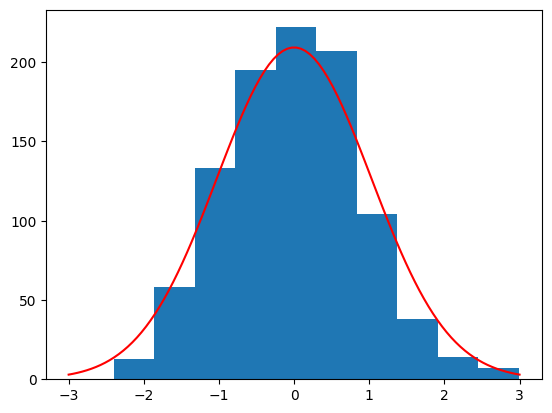

In [3]:
# Calculamos el valor medio y la varianza para la posición
x_pos, vels = evolucion[-1]
sigmax = np.average(x_pos[:,0]**2)-np.average(x_pos[:,0])**2

# Mostramos los estimadores estadísticos
for key, val in (
{"<x>":np.average(x_pos[:,0]),
 "<v>":np.average(vels[:,0]),
 "sigma_x**2":sigmax,
 "sigma_v**2":np.average(vels[:,0]**2)-np.average(vels[:,0])**2,
 "corr(x,v)": np.average(x_pos[:,0]*vels[:,0])-np.average(vels[:,0])*np.average(x_pos[:,0])
}).items():
    print(f"{key}:   {np.round(val,4)}")
    
# y el histograma
hist_res = plt.hist([x for x,y in x_pos if -3<x<3])
xs = np.linspace(-3,3,100)
plt.plot(xs, ( hist_res[1][1]-hist_res[1][0]) * len(PARTICULAS)*np.exp(-.5/sigmax *xs**2)/(np.sqrt(2*np.pi*sigmax)) ,c="red")
plt.show()
plt.close()



## Animación

In [4]:
    
# Esto muestra la animación

def initialize(evolucion):
    """
    Inicializa el escenario
    """
    fig, ax = plt.subplots()
    particles = []
    ax.text(1.2,4,f"radio={RADIO}")
    ax.text(1.2,3.7,f"aceleración={ACELERACION}")
    ax.text(1.2,3.4,f"coef. restitucion={RESTITUCION}")
    ax.add_line(plt.Line2D([.5,2.5],[4,0]))
    ax.add_line(plt.Line2D([-.5,-2.5],[4,0]))
    for pos in DISPERSORES:
        ax.add_artist(plt.Circle(pos,RADIO))
    for pos in evolucion[-1][0][:100]:
        particle = plt.Circle(pos,.02,color="green")
        particles.append(particle)
        ax.add_artist(particle)

    ax.set_xlim(-4,4)
    ax.set_ylim(-1,5)
    return fig, ax, particles
    
    
    
fig, ax, particles =  initialize(evolucion)



def update(frame):
    """Actualiza la animación"""
    global evolucion
    global particles
    if frame>len(evolucion):
        return None
    state = evolucion[frame][0][:100]
    for i, coords in enumerate(state):
        particles[i].set_center(coords)
    return
        


# Construye la animación

ani = animation.FuncAnimation(fig=fig, func=update, frames=400, interval=30)

# Convierte la animación en algo que podamos ver directamente en la notebook:
display(HTML(ani.to_jshtml()))
plt.close()


## Tareas


* Ejecutar varias veces la simulación, con los mismos parámetros para la dispersión "realista". ¿Cambian los estimadores estadísticos? ¿Cuánto?
* Hacer lo mismo usando la dispersión binaria. Comparar los resultados con los obtenidos en la dispersión realista.
* Probar cómo cambian los estimadores estadísticos al modificar los parámetros del modelo.
* Implementar en forma más realista el choque con las paredes. ¿Cambian los resultados?